In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from collections import Counter
from wordcloud import WordCloud
from PIL import ImageDraw

In [15]:
df = pd.read_pickle("~/Downloads/df_complete")

In [17]:
sorted(df["Country name"].unique())

['Afghanistan',
 'Albania',
 'Algeria',
 'Angola',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Costa Rica',
 'Croatia',
 'Cyprus',
 'Denmark',
 'Djibouti',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Finland',
 'France',
 'Gabon',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Guatemala',
 'Guinea',
 'Haiti',
 'Honduras',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Jamaica',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kenya',
 'Kuwait',
 'Laos',
 'Latvia',
 'Lebanon',
 'Lesotho',
 'Liberia',
 'Libya',
 'Lithuania',
 'Madagascar',
 'Malawi',
 'Malaysia',
 'Mali',
 'Mauritania'

In [18]:
# Download necessary nltk data (if not already done)
nltk.download('vader_lexicon')
nltk.download('stopwords')

# Define a set of common UN-related words to ignore
common_un_words = set([
    'nations', 'united', 'international', 'development', 'world', 
    'security', 'global', 'africa', 'peace', 'people', 'humanity', 
    'cooperation', 'dialogue', 'assembly', 'agenda', 'rights',
    'countries', 'country', 'globalization', 
    'governments', 'leaders', 'economy', 'justice', 'goals'
])

# Merge common UN words with English stopwords
stop_words = set(stopwords.words('english')).union(common_un_words)

# Function to clean speech text and remove common UN-related words
def clean_speech(text):
    # Initial cleaning
    text = re.sub(r'\[.*?\]', '', text)  # Remove text in square brackets
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'\w*\d\w*', '', text)  # Remove words containing numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove non-alphabetical characters
    text = text.lower()  # Convert to lowercase

    # Tokenize and remove stop words
    words = text.split()
    cleaned_words = [word for word in words if word not in stop_words]
    
    # Join words back into cleaned speech
    return ' '.join(cleaned_words)

# Apply cleaning function to the dataset
df['cleaned_speech'] = df['Speech'].apply(clean_speech)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/jonathan/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jonathan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


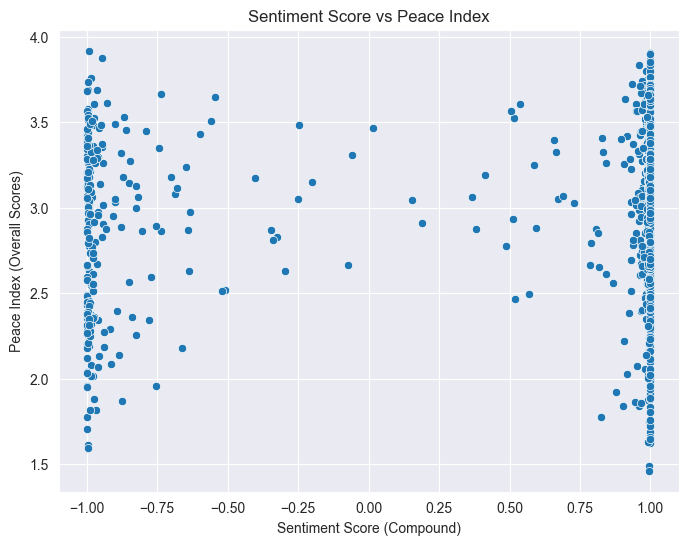

In [19]:
# Set up sentiment analysis
sia = SentimentIntensityAnalyzer()

# Apply sentiment analysis on cleaned speeches
df['sentiment_score'] = df['cleaned_speech'].apply(lambda x: sia.polarity_scores(x)['compound'])

# EDA 1: Correlation between sentiment score and peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='sentiment_score', y='Overall Scores')
plt.title('Sentiment Score vs Peace Index')
plt.xlabel('Sentiment Score (Compound)')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()

In [20]:
# EDA 2: Topic modeling (LDA) on speeches
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

# Convert cleaned speeches to document-term matrix
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = vectorizer.fit_transform(df['cleaned_speech'])

# LDA topic modeling
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(dtm)

# Display topics
no_top_words = 10
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
human council states sustainable efforts need climate support new law
Topic 1:
today new human years time states war economic change peoples
Topic 2:
sustainable climate change efforts challenges support economic human community new
Topic 3:
region state arab efforts states terrorism political support israel council
Topic 4:
african support efforts republic government general economic political national community


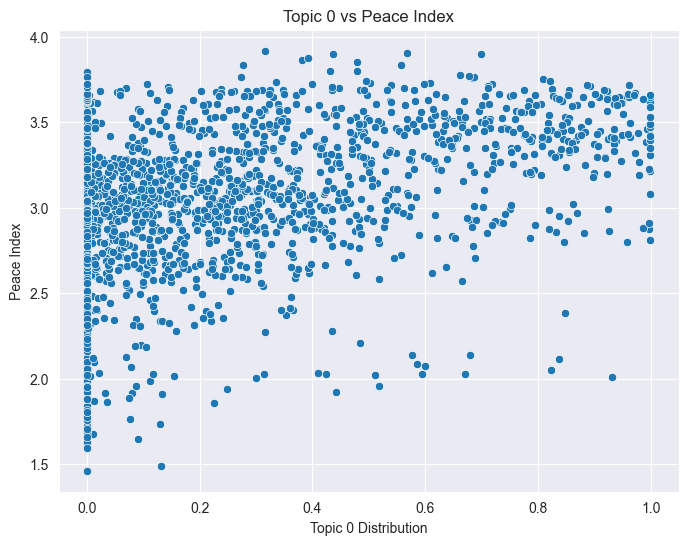

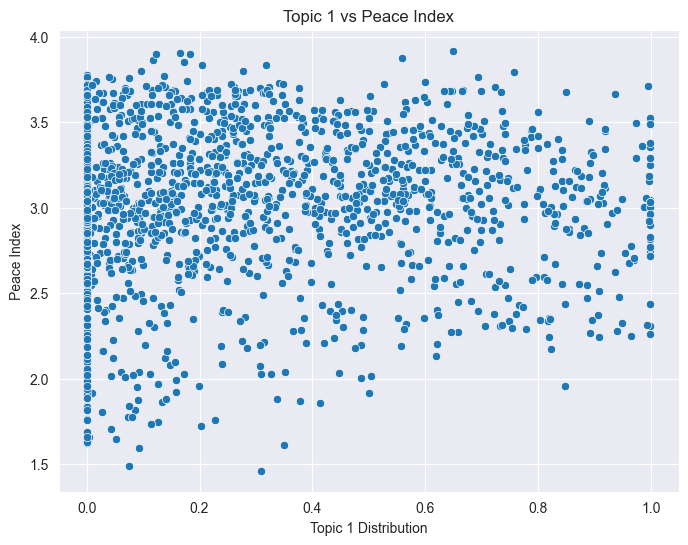

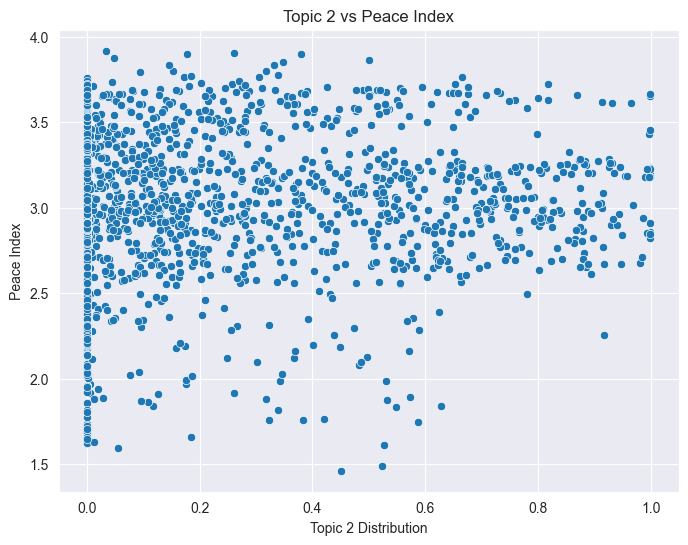

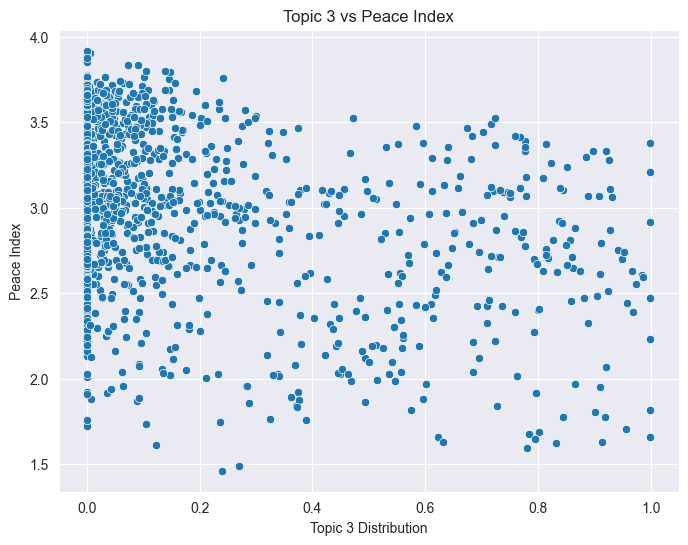

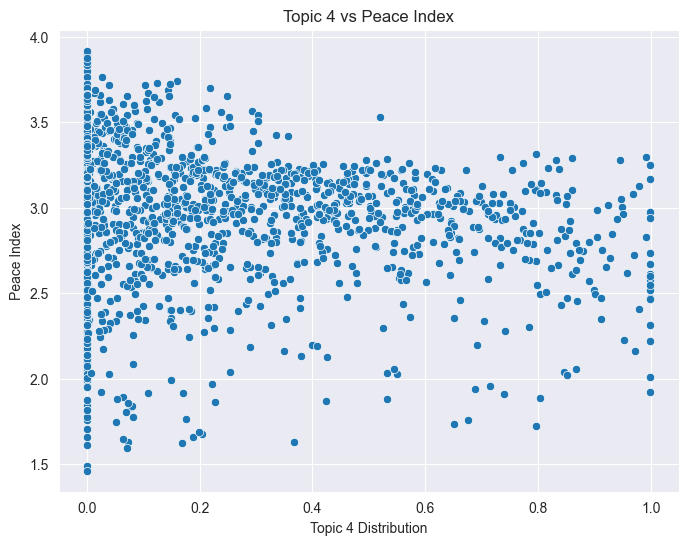

In [21]:
# EDA 3: Correlation of topic distribution and peace index
topic_dist = lda.transform(dtm)
df_topics = pd.DataFrame(topic_dist, columns=[f'Topic_{i}' for i in range(topic_dist.shape[1])])
df_with_topics = pd.concat([df, df_topics], axis=1)

# Plot correlation between topics and peace index
for i in range(topic_dist.shape[1]):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df_with_topics[f'Topic_{i}'], y=df_with_topics['Overall Scores'])
    plt.title(f'Topic {i} vs Peace Index')
    plt.xlabel(f'Topic {i} Distribution')
    plt.ylabel('Peace Index')
    plt.show()

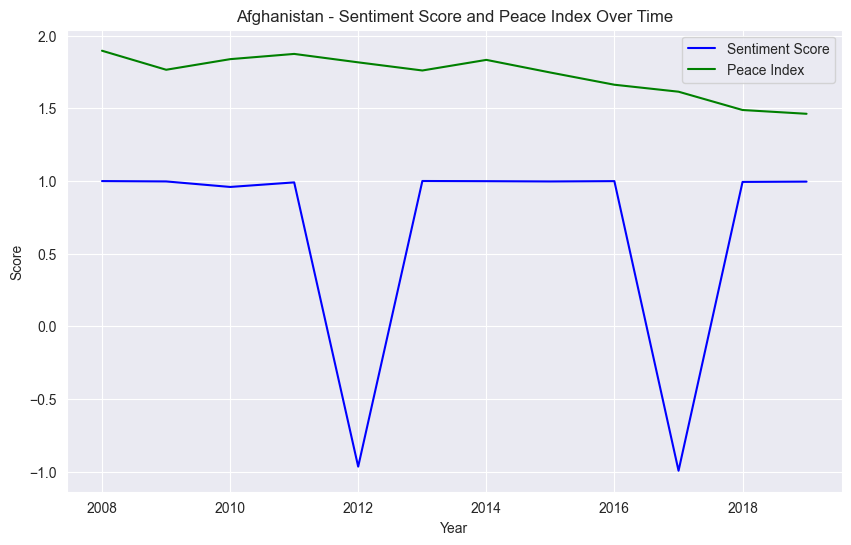

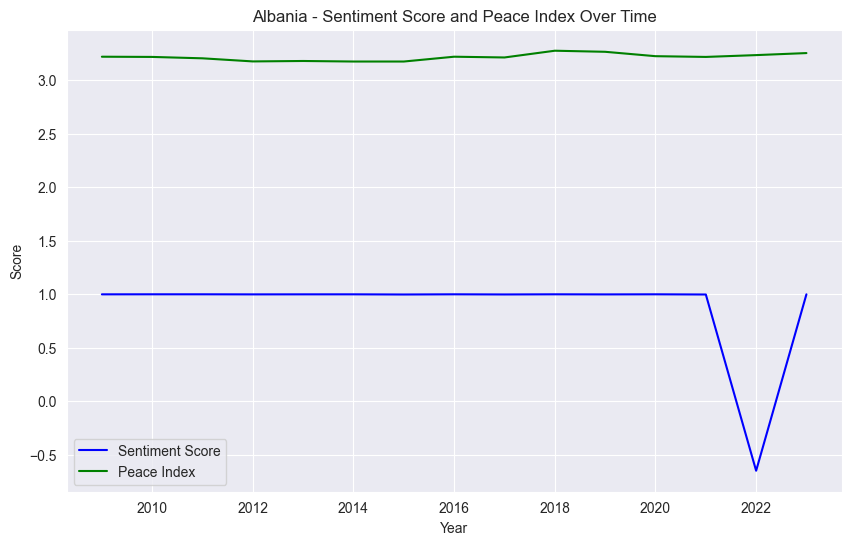

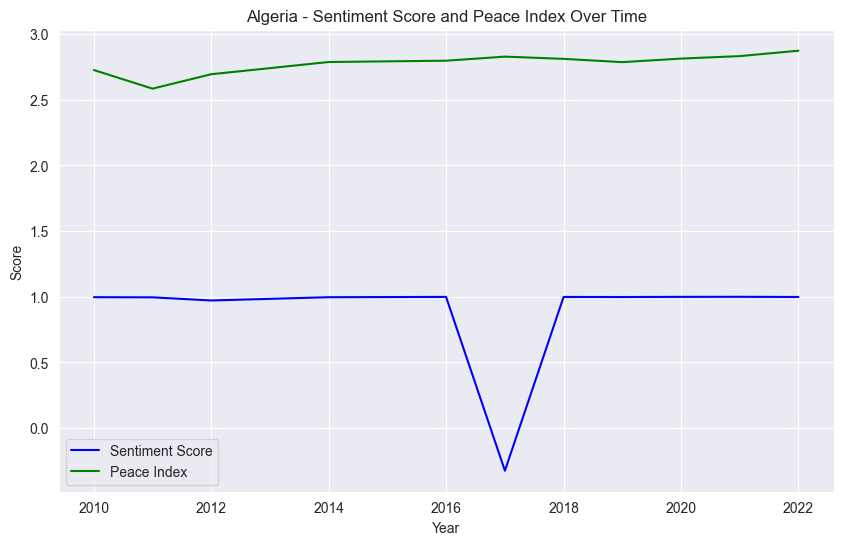

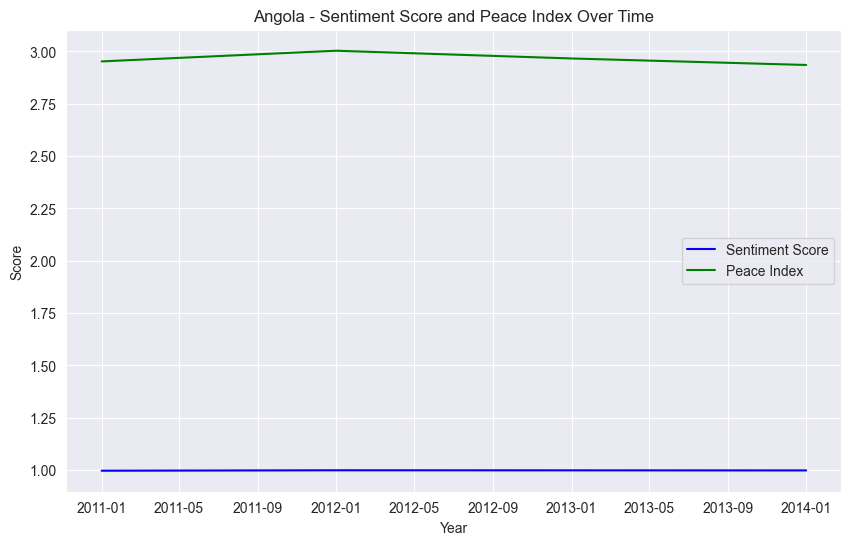

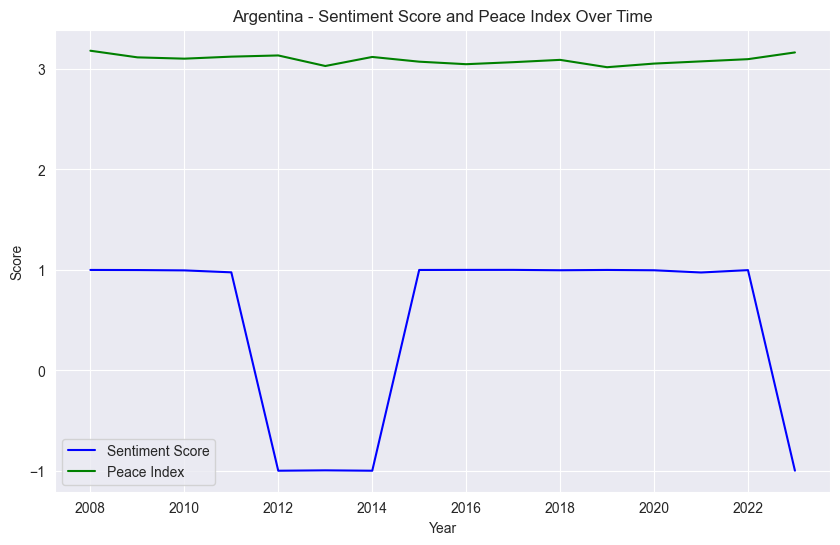

...

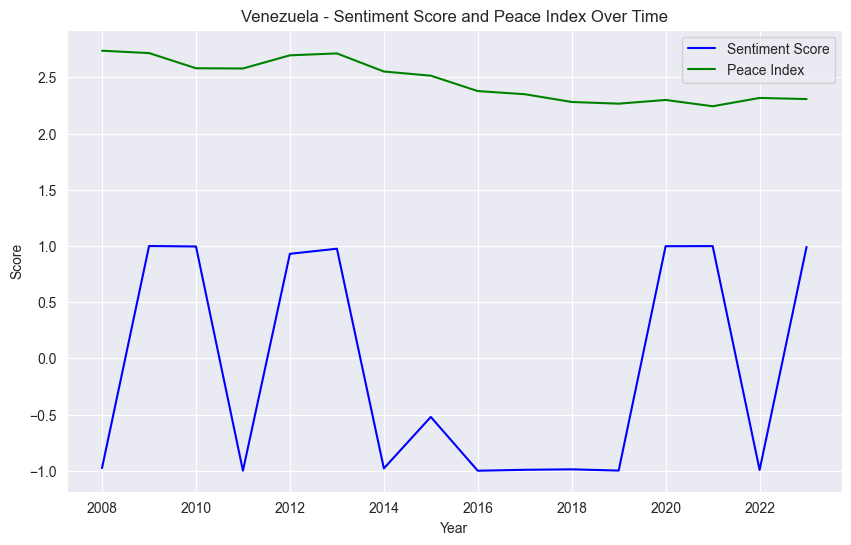

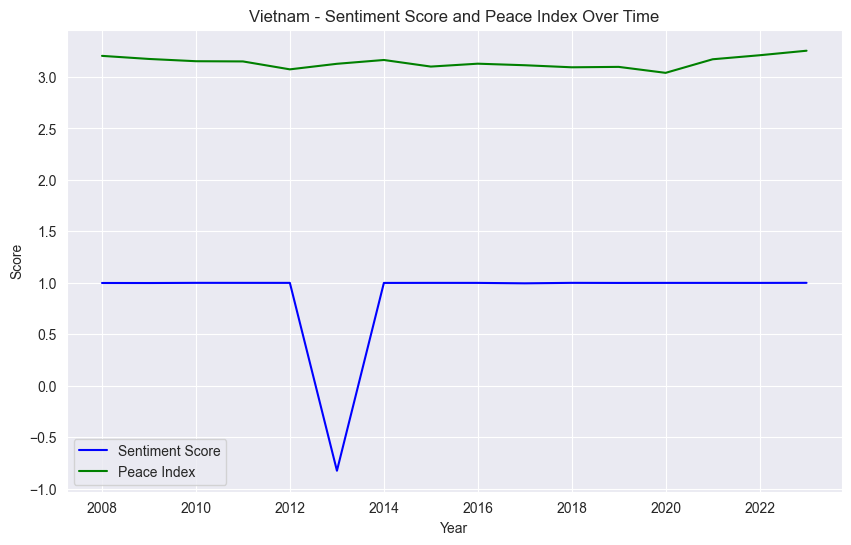

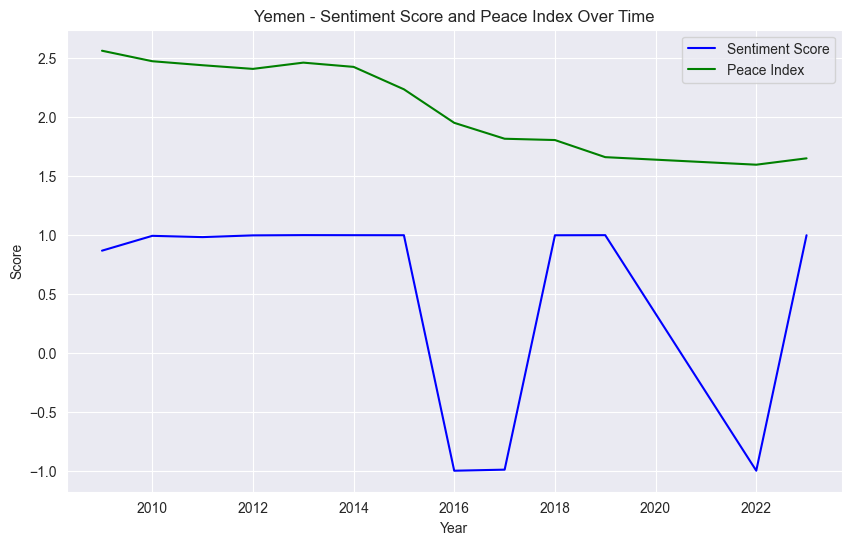

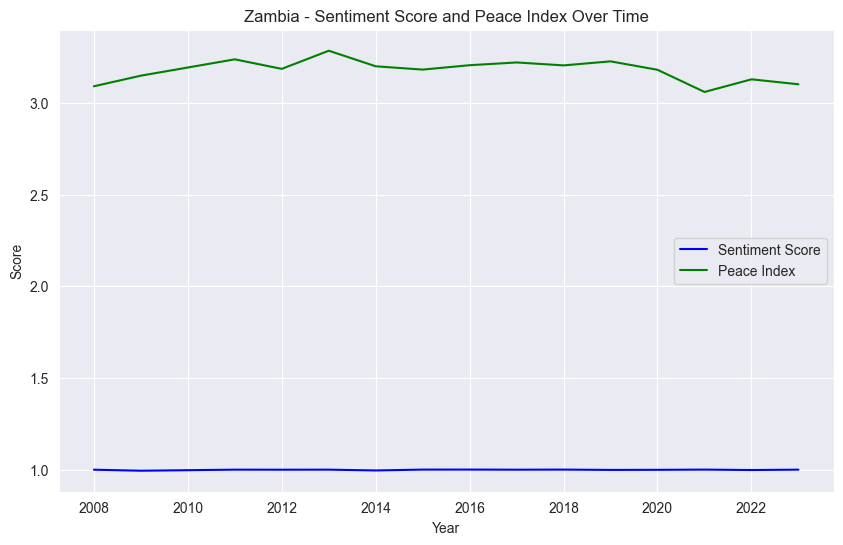

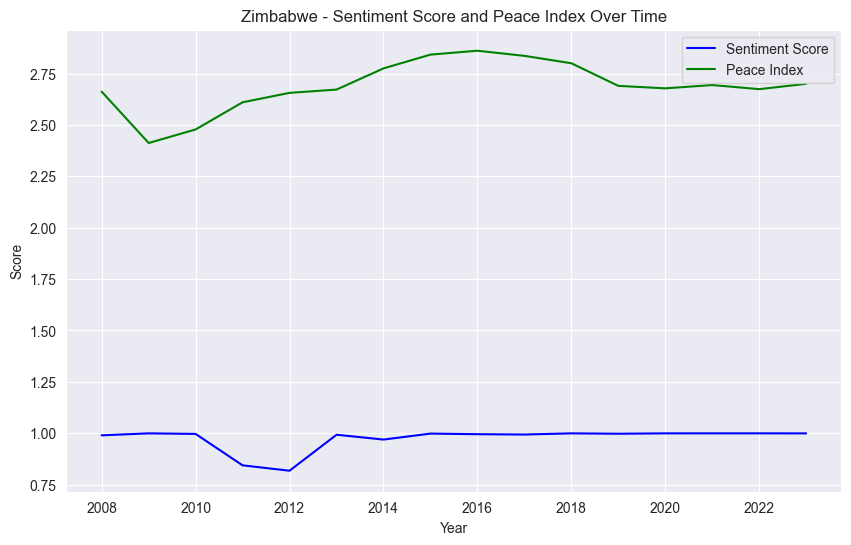

In [22]:
# EDA 4: Changes in speech tone over time relative to peace index
df['year'] = pd.to_datetime(df['year'], format='%Y')
df.sort_values(by=['Country name', 'year'], inplace=True)

# Group by country to observe changes in sentiment over time
country_groups = df.groupby('Country name')

for name, group in country_groups:
    plt.figure(figsize=(10, 6))
    plt.plot(group['year'], group['sentiment_score'], label='Sentiment Score', color='blue')
    plt.plot(group['year'], group['Overall Scores'], label='Peace Index', color='green')
    plt.title(f'{name} - Sentiment Score and Peace Index Over Time')
    plt.xlabel('Year')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

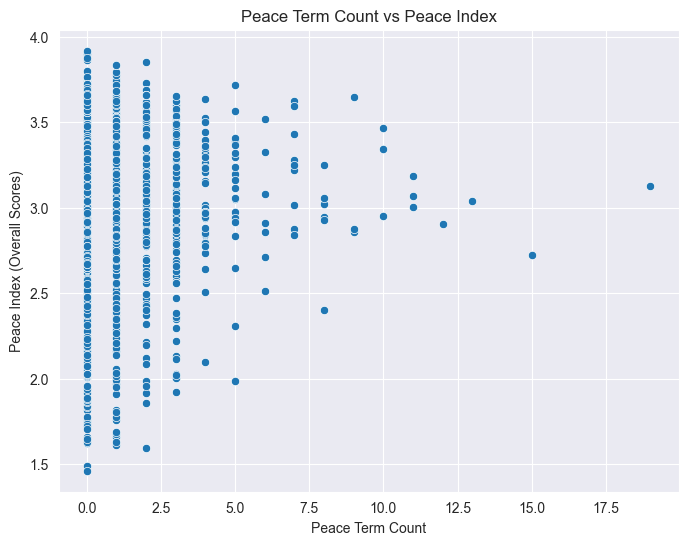

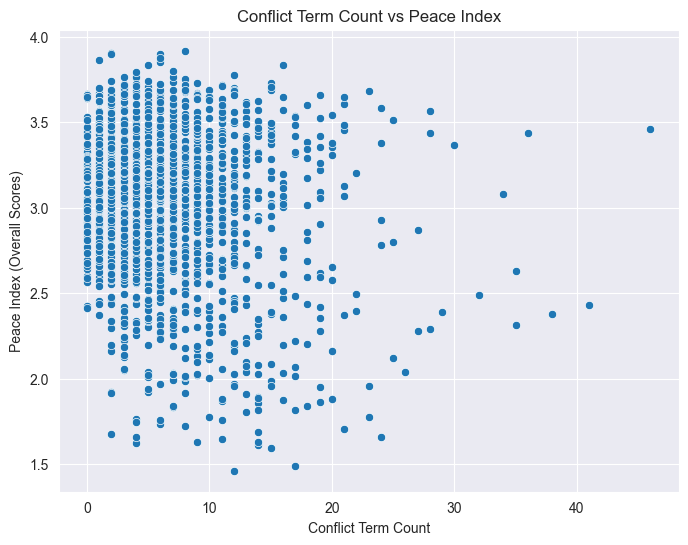

In [23]:
# EDA 5: Mentions of peace/conflict-related terms vs. Peace Index

# Define lists of peace- and conflict-related terms
peace_terms = ['peace', 'harmony', 'cooperation', 'dialogue', 'negotiation', 'mediation', 'diplomacy']
conflict_terms = ['war', 'conflict', 'violence', 'aggression', 'hostility', 'terrorism', 'casualities']

# Function to count term frequency in speech
def count_terms(speech, term_list):
    speech_words = speech.split()
    term_counts = sum([1 for word in speech_words if word in term_list])
    return term_counts

df['peace_term_count'] = df['cleaned_speech'].apply(lambda x: count_terms(x, peace_terms))
df['conflict_term_count'] = df['cleaned_speech'].apply(lambda x: count_terms(x, conflict_terms))

# Plot peace term count vs. peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='peace_term_count', y='Overall Scores')
plt.title('Peace Term Count vs Peace Index')
plt.xlabel('Peace Term Count')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()

# Plot conflict term count vs. peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='conflict_term_count', y='Overall Scores')
plt.title('Conflict Term Count vs Peace Index')
plt.xlabel('Conflict Term Count')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()


Top 10 words for Africa:
african: 2279
support: 2005
efforts: 1961
economic: 1688
sustainable: 1687
community: 1609
states: 1600
general: 1555
climate: 1478
national: 1469

Top 10 words for Asia:
human: 1306
economic: 1249
sustainable: 1230
efforts: 1217
community: 1206
climate: 1131
new: 1129
change: 1067
states: 1060
support: 1023

Top 10 words for Europe:
human: 3064
states: 2557
new: 2285
council: 2202
support: 2039
need: 1974
sustainable: 1918
efforts: 1911
climate: 1847
years: 1841

Top 10 words for Middle East:
region: 788
efforts: 758
arab: 752
israel: 723
state: 721
states: 703
iran: 647
support: 635
political: 593
iraq: 544

Top 10 words for North America:
canada: 312
mexico: 281
human: 195
change: 139
support: 126
work: 123
states: 122
today: 121
council: 114
climate: 113

Top 10 words for Oceania:
new: 369
australia: 300
zealand: 209
council: 198
pacific: 183
states: 158
climate: 147
change: 146
work: 145
region: 135

Top 10 words for Other:
human: 725
states: 621
economic

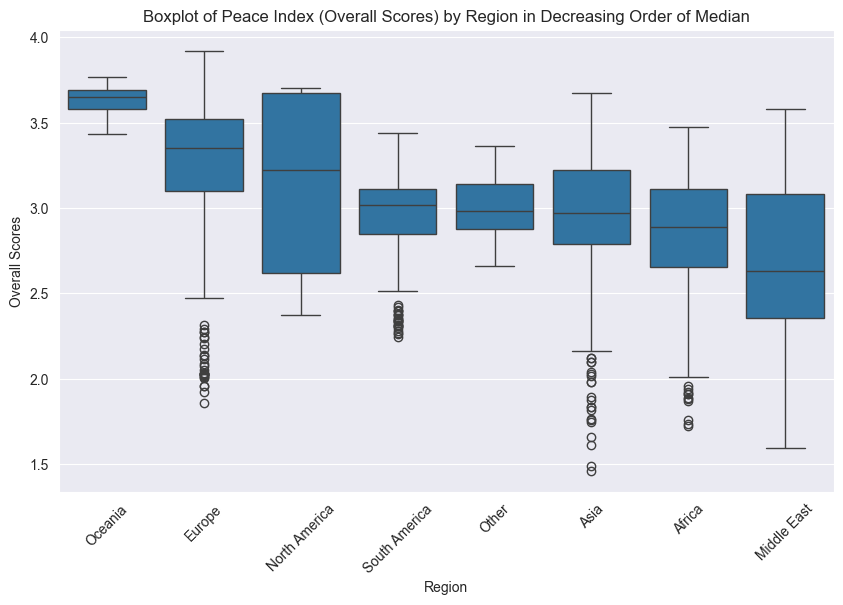

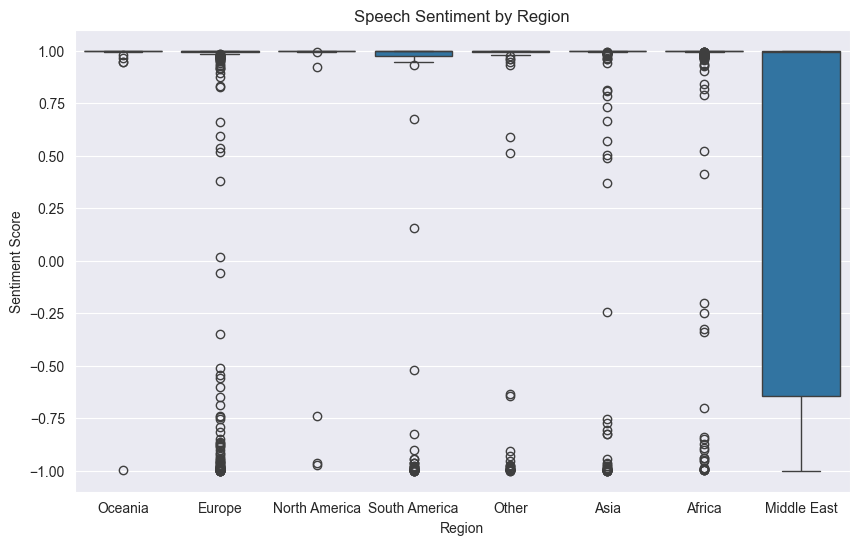

In [24]:
# EDA 6: Geopolitical regions, peace index, and speech content
# Define regions (for the sake of simplicity, group countries into regions manually or use an external dataset)
# Example region grouping (a more detailed region classification could be used)
from regions import regions

# Add region information to dataframe
def get_region(country_name):
    for region, countries in regions.items():
        if country_name in countries:
            return region
    return 'Other'

df['Region'] = df['Country name'].apply(get_region)

# Group by region and analyze speech content
region_groups = df.groupby('Region')

# Function to print the top N words for each region
def print_top_words(region, text_data, n=10):
    vectorizer = CountVectorizer(stop_words='english', max_features=n)
    X = vectorizer.fit_transform(text_data)
    word_counts = X.toarray().sum(axis=0)
    words = vectorizer.get_feature_names_out()
    word_freq = dict(zip(words, word_counts))
    
    # Sort words by frequency and print the top N
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
    print(f"\nTop {n} words for {region}:")
    for word, count in sorted_words:
        print(f"{word}: {count}")

# Loop over each region and print the top words
for region, group in region_groups:
    text_data = group['cleaned_speech'].values
    print_top_words(region, text_data)

# Calculate median peace index for each region
median_peace_by_region = df.groupby('Region')['Overall Scores'].median().sort_values(ascending=False)

# Reorder the DataFrame based on the sorted region order
df['Region'] = pd.Categorical(df['Region'], categories=median_peace_by_region.index, ordered=True)

# Plot boxplots in the decreasing order of median peace index
plt.figure(figsize=(10, 6))
sns.boxplot(x='Region', y='Overall Scores', data=df, order=median_peace_by_region.index)
plt.title('Boxplot of Peace Index (Overall Scores) by Region in Decreasing Order of Median')
plt.xticks(rotation=45)
plt.show()

# Explore regional differences in speech tone (sentiment)
plt.figure(figsize=(10, 6))
sns.boxplot(x='Region', y='sentiment_score', data=df)
plt.title('Speech Sentiment by Region')
plt.xlabel('Region')
plt.ylabel('Sentiment Score')
plt.show()

/var/folders/9t/wy67rldj55lgyg68bm87x7pw0000gp/T/ipykernel_54834/3836644689.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ukraine_df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)
/var/folders/9t/wy67rldj55lgyg68bm87x7pw0000gp/T/ipykernel_54834/3836644689.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  ukraine_df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)


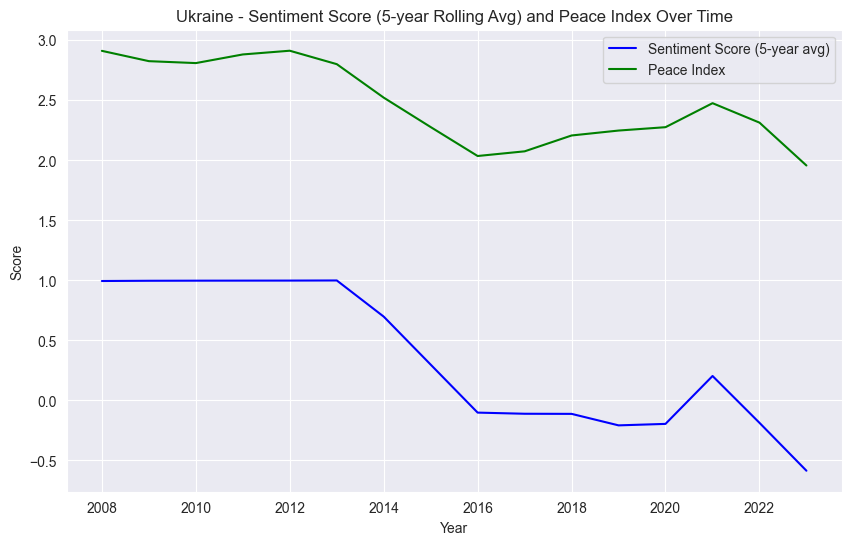

In [43]:
# Filter the dataframe for Ukraine
ukraine_df = df[df['Country name'] == 'Ukraine']

# Apply a rolling 5-year average for sentiment score to better smooth fluctuations
ukraine_df = ukraine_df.set_index('year').sort_index()
ukraine_df['sentiment_score_rolling'] = ukraine_df['sentiment_score'].rolling(window=5, min_periods=1).mean()

# Fill any missing values after the rolling calculation (if necessary)
ukraine_df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)

# Plot the sentiment score (5-year rolling avg) and the peace index
plt.figure(figsize=(10, 6))
plt.plot(ukraine_df.index, ukraine_df['sentiment_score_rolling'], label='Sentiment Score (5-year avg)', color='blue')
plt.plot(ukraine_df.index, ukraine_df['Overall Scores'], label='Peace Index', color='green')
plt.title('Ukraine - Sentiment Score (5-year Rolling Avg) and Peace Index Over Time')
plt.xlabel('Year')
plt.ylabel('Score')
plt.legend()
plt.show()


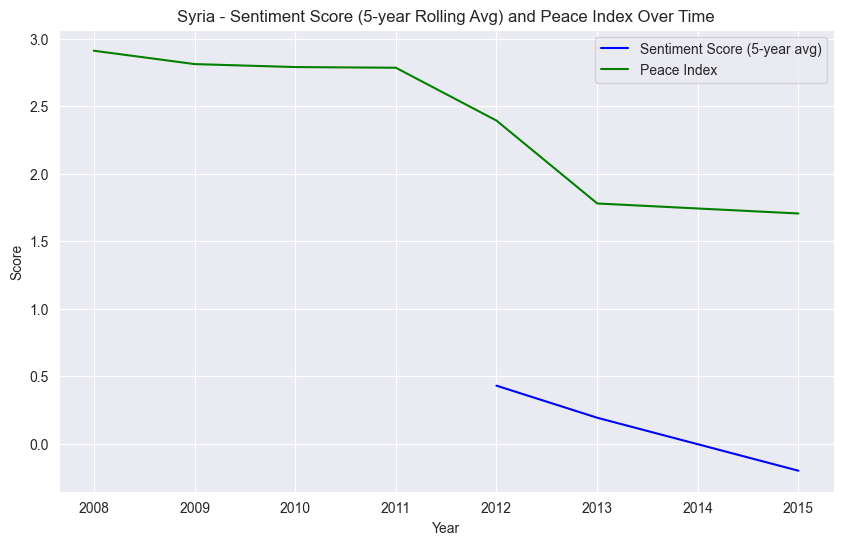

In [49]:
# Ensure 'year' is in the correct datetime format
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce')

# Extract only the year component (this will turn the year into integers)
df['year'] = df['year'].dt.year

# Sort the DataFrame by 'Country name' and 'year'
df.sort_values(by=['Country name', 'year'], inplace=True)

# Group by 'Country name' and calculate the rolling average for each country without setting 'year' as the index
df['sentiment_score_rolling'] = df.groupby('Country name')['sentiment_score'].transform(lambda x: x.rolling(window=5, min_periods=1).mean())

# Handle missing data by forward filling any NaNs
df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)

df.head(10)

/var/folders/9t/wy67rldj55lgyg68bm87x7pw0000gp/T/ipykernel_54834/381187532.py:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)
/var/folders/9t/wy67rldj55lgyg68bm87x7pw0000gp/T/ipykernel_54834/381187532.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)


,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,...,Overall Scores,Safety and Security,Ongoing Conflict,Militarian,cleaned_speech,sentiment_score,peace_term_count,conflict_term_count,Region,sentiment_score_rolling
0,Afghanistan,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.164055,0.881686,0.414297,...,1.896,3.372,3.153,2.594,since last time gathered great hall passed yea...,0.9990,0,14,Asia,0.999000
1,Afghanistan,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.187297,0.850035,0.481421,...,1.765,3.603,3.246,2.609,first would like congratulate excellency mr tr...,0.9965,0,4,Asia,0.997750
2,Afghanistan,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.117861,0.706766,0.516907,...,1.838,3.549,3.087,2.629,join previous speakers congratulating sir elec...,0.9585,0,18,Asia,0.984667
3,Afghanistan,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.160098,0.731109,0.479835,...,1.874,3.549,3.038,2.555,honoured read statement president excellency h...,0.9899,0,16,Asia,0.985975
4,Afghanistan,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.234157,0.775620,0.613513,...,1.816,3.593,3.069,2.693,speak today shaken depravity fanatics committe...,-0.9661,0,17,Asia,0.595560
5,Afghanistan,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.059246,0.823204,0.547417,...,1.760,3.790,3.101,2.542,bring warm greetings good wishes afghan honour...,0.9995,0,11,Asia,0.595660
6,Afghanistan,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.102330,0.871242,0.491641,...,1.833,3.644,3.095,2.504,gives great pleasure express sincere congratul...,0.9983,0,7,Asia,0.596020
7,Afghanistan,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.078218,0.880638,0.491410,...,1.746,3.862,3.108,2.458,gives great pleasure behalf islamic republic a...,0.9963,0,4,Asia,0.603580
8,Afghanistan,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.040480,0.793246,0.501409,...,1.662,3.871,3.369,2.412,distinct pleasure attend seventyfirst session ...,0.9986,1,24,Asia,0.605320
9,Afghanistan,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.122848,0.954393,0.435270,...,1.614,3.883,3.480,2.433,stand general today reminded wise men women di...,-0.9943,1,14,Asia,0.599680


In [55]:
# Ensure we are working with only numerical columns
numerical_df = df.select_dtypes(include='number')

# Calculate the correlation between all numerical columns and the 'Overall Scores' column (Peace Index)
correlations = numerical_df.corr()['Overall Scores'].sort_values(ascending=False)

# Print the correlation results
print("correlations with peace index")
print(correlations)


correlations with peace index
Overall Scores                      1.000000
Log GDP per capita                  0.522039
Life Ladder                         0.492368
Healthy life expectancy at birth    0.475893
Social support                      0.445146
Freedom to make life choices        0.403474
Positive affect                     0.305994
sentiment_score_rolling             0.267053
sentiment_score                     0.138919
Generosity                          0.110654
Polarity_score                      0.106171
peace_term_count                    0.013014
year                                0.003144
conflict_term_count                -0.139605
Perceptions of corruption          -0.332434
Negative affect                    -0.339416
Militarian                         -0.567147
Ongoing Conflict                   -0.895527
Safety and Security                -0.907123
Name: Overall Scores, dtype: float64


In [53]:
# Create a dictionary to store the correlation values for each country
correlations_by_country = {}

# Group by 'Country name' and calculate the correlation for each group
for country, group in df.groupby('Country name'):
    # Drop rows with missing values in either 'sentiment_score_rolling' or 'Overall Scores'
    group = group[['sentiment_score_rolling', 'Overall Scores']].dropna()
    
    # Check if there is enough data to calculate correlation
    if len(group) > 1:  # Correlation requires at least 2 data points
        correlation = group['sentiment_score_rolling'].corr(group['Overall Scores'])
        correlations_by_country[country] = correlation

# Convert the dictionary to a pandas DataFrame for easy sorting and manipulation
correlation_df = pd.DataFrame(list(correlations_by_country.items()), columns=['Country', 'Correlation'])

# Sort the DataFrame by correlation values in descending order
correlation_df.sort_values(by='Correlation', ascending=False, inplace=True)

# Display the top 10 countries with the highest correlations
print(correlation_df.head(10))


         Country  Correlation
34      Djibouti     1.000000
133      Ukraine     0.951415
140        Yemen     0.942159
107       Rwanda     0.843576
45       Georgia     0.806536
105      Romania     0.768459
122       Sweden     0.768046
120    Sri Lanka     0.760955
118  South Sudan     0.749581
65    Kazakhstan     0.739721


In [54]:
# Filter the DataFrame for countries with a negative correlation
negative_correlation_df = correlation_df[correlation_df['Correlation'] < 0]

# Filter the DataFrame for countries with a positive correlation
positive_correlation_df = correlation_df[correlation_df['Correlation'] > 0]

# Print the number of countries with a negative correlation
print(f"Number of countries with a negative correlation: {len(negative_correlation_df)}")

# Print the number of countries with a positive correlation
print(f"Number of countries with a positive correlation: {len(positive_correlation_df)}")


Number of countries with a negative correlation: 67
Number of countries with a positive correlation: 76


In [60]:
numerical_df = df.select_dtypes(include='number')

# Calculate the correlation between all numerical columns and the 'Overall Scores' column (Peace Index)
correlations = numerical_df.corr()['Overall Scores'].sort_values(ascending=False)

# Print the correlation results
print("correlations with peace index")
print(correlations)

correlations with peace index
Overall Scores                      1.000000
Log GDP per capita                  0.522039
Life Ladder                         0.492368
Healthy life expectancy at birth    0.475893
Social support                      0.445146
Freedom to make life choices        0.403474
Positive affect                     0.305994
sentiment_score_rolling             0.267053
sentiment_score                     0.138919
Generosity                          0.110654
Polarity_score                      0.106171
peace_term_count                    0.013014
year                                0.003144
conflict_term_count                -0.139605
Perceptions of corruption          -0.332434
Negative affect                    -0.339416
Militarian                         -0.567147
Ongoing Conflict                   -0.895527
Safety and Security                -0.907123
Name: Overall Scores, dtype: float64


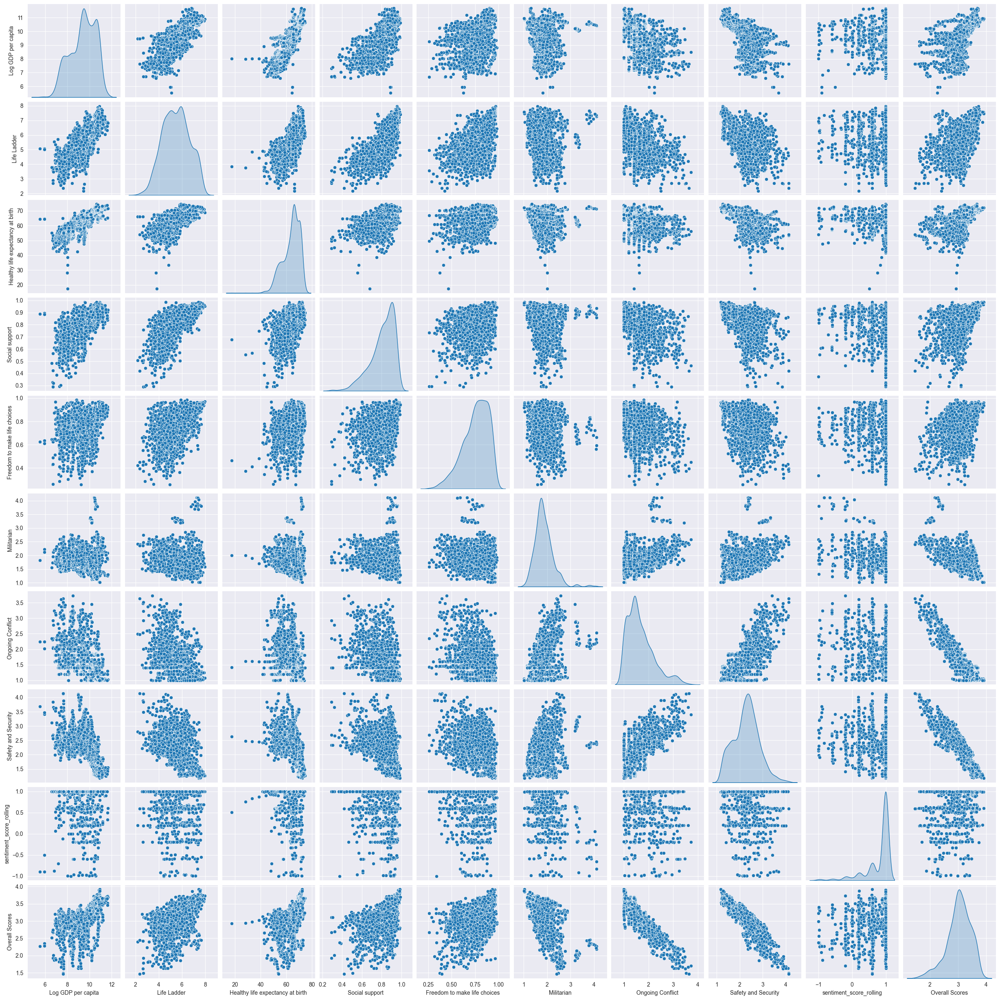

In [57]:
selected_features = ['Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 
                     'Social support', 'Freedom to make life choices', 'Militarian', 
                     'Ongoing Conflict', 'Safety and Security', 'sentiment_score_rolling', 'Overall Scores']

# Filter the dataframe to include only the selected features
df_selected = df[selected_features].dropna()

# Create a seaborn pairplot to visualize the relationships between variables
sns.pairplot(df_selected, diag_kind='kde')

# Display the plot
plt.show()


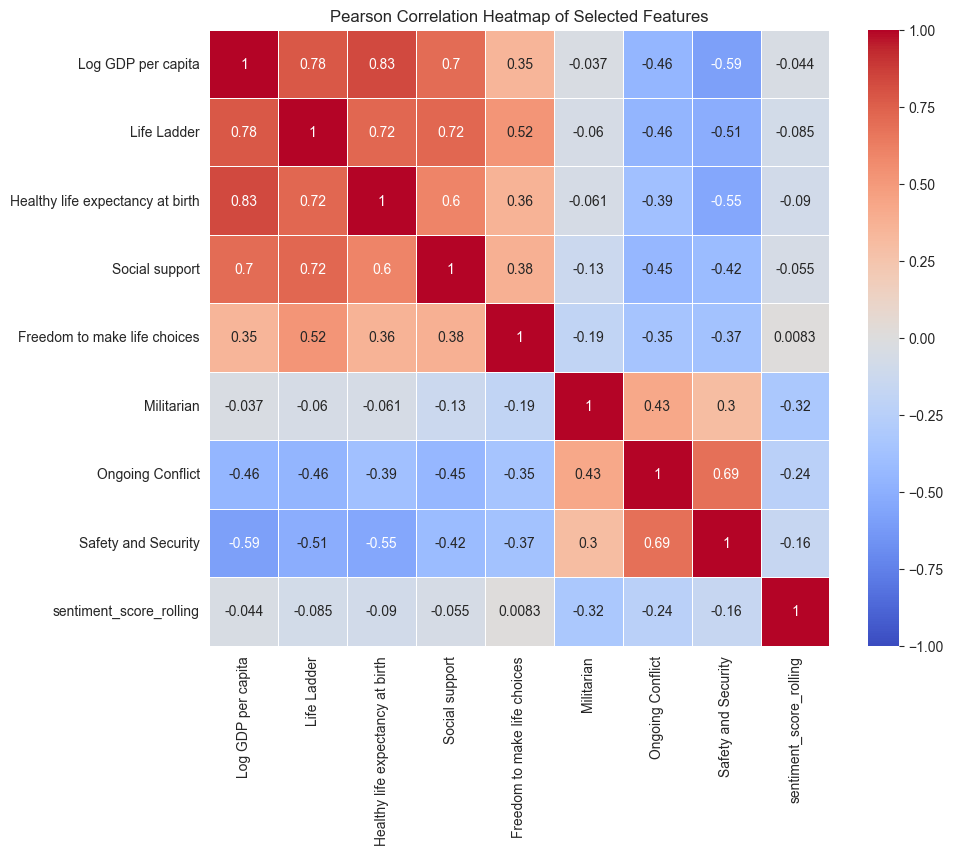

In [58]:
selected_features = ['Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 
                     'Social support', 'Freedom to make life choices', 'Militarian', 
                     'Ongoing Conflict', 'Safety and Security', 'sentiment_score_rolling']

# Filter the dataframe to include only the selected features
df_selected = df[selected_features].dropna()

# Calculate the Pearson correlation matrix
correlation_matrix = df_selected.corr()

# Plot the heatmap for the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, vmin=-1, vmax=1)
plt.title('Pearson Correlation Heatmap of Selected Features')
plt.show()


In [59]:
df.to_pickle('updated_dataframe.pkl')